In [1]:
# import os
# from google.colab import drive
# drive.mount('/content/gdrive')
# os.chdir('/content/gdrive/My Drive/Lecture/')

In [1]:
import os, copy
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

DATA_PATH = os.getenv('HOME') + '/aiffel/object_detection/data'

In [3]:
(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir=DATA_PATH,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

In [4]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    full_name='kitti/3.2.0',
    description="""
    Kitti contains a suite of vision tasks built using an autonomous driving
    platform. The full benchmark contains many tasks such as stereo, optical flow,
    visual odometry, etc. This dataset contains the object detection dataset,
    including the monocular images and bounding boxes. The dataset contains 7481
    training images annotated with 3D bounding boxes. A full description of the
    annotations can be found in the readme of the object development kit readme on
    the Kitti homepage.
    """,
    homepage='http://www.cvlibs.net/datasets/kitti/',
    data_path='/aiffel/aiffel/object_detection/data/kitti/3.2.0',
    download_size=11.71 GiB,
    dataset_size=5.27 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
     

,image,image/file_name,objects/alpha,objects/bbox,objects/dimensions,objects/location,objects/occluded,objects/rotation_y,objects/truncated,objects/type
0,,003404.png,-0.86-1.6-0.511.441.771.94,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",011001,-1.56-1.080.091.241.461.48,0.960.00.00.00.00.0,0 (Car)5 (Cyclist)0 (Car)0 (Car)7 (Misc)0 (Car)
1,,006286.png,-1.582.081.78-1.51,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",0110,-1.591.541.54-1.58,0.00.00.00.0,0 (Car)0 (Car)1 (Van)0 (Car)
2,,004184.png,-2.85-2.9-1.78-2.94-2.96,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",12022,-3.12-3.13-1.52-3.14-3.13,0.00.00.00.00.0,0 (Car)0 (Car)0 (Car)0 (Car)0 (Car)
3,,004536.png,-0.5-2.062.522.553.082.942.74...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",1001001...,0.15-1.571.921.88-3.03-2.96-2.86...,0.00.00.680.770.00.00.28...,5 (Cyclist)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)5 (Cyclist)5 (Cyclist)...
4,,002892.png,-2.11-1.78-2.09-2.23-2.35-2.54-2.81...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",0210020...,-1.65-2.02-1.69-2.02-2.38-2.27-2.72...,0.310.00.060.00.00.00.0...,3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)3 (Pedestrian)...
5,,002935.png,-2.321.771.24-1.811.231.621.71...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",0001112...,-1.551.591.85-1.581.61.571.58...,0.970.00.70.00.00.00.0...,0 (Car)0 (Car)4 (Person_sitting)0 (Car)0 (Car)0 (Car)0 (Car)...
6,,004228.png,2.13-1.761.651.451.58-1.63,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=f
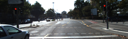
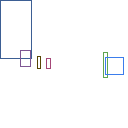
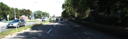
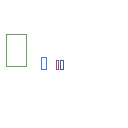
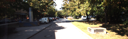
...
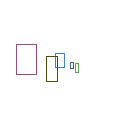
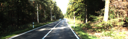
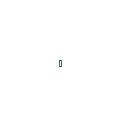
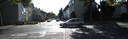
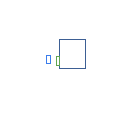

In [5]:
tfds.as_dataframe(ds_train.take(10), ds_info)

### Kitti dataset 분석
- 각 이미지에 존재하는 물체들에 대한 정보가 `objects` key로 존재
  ```
   Values    Name      Description
   ----------------------------------------------------------------------------
      1    type         Describes the type of object: 'Car', 'Van', 'Truck',
                        'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram',
                        'Misc' or 'DontCare'
      1    truncated    Float from 0 (non-truncated) to 1 (truncated), where
                        truncated refers to the object leaving image boundaries
      1    occluded     Integer (0,1,2,3) indicating occlusion state:
                        0 = fully visible, 1 = partly occluded
                        2 = largely occluded, 3 = unknown
      1    alpha        Observation angle of object, ranging [-pi..pi]
      4    bbox         2D bounding box of object in the image (0-based index):
                        contains left, top, right, bottom pixel coordinates
      3    dimensions   3D object dimensions: height, width, length (in meters)
      3    location     3D object location x,y,z in camera coordinates (in meters)
      1    rotation_y   Rotation ry around Y-axis in camera coordinates [-pi..pi]
      1    score        Only for results: Float, indicating confidence in
                        detection, needed for p/r curves, higher is better.
  ```

- label은 각 `type`이라는 키로 저장 
   - 0 - `Car`, 1 - `Van`, 2 - `Truck`, 3 - `Pedestrian`, 4 - `Person_sitting`, 5 - `Cyclist`, 6 - `Tram`, 7 - `Misc` or `DontCare`
- bounding box는 `bbox`
  - 순서대로 `left`, `top`, `right`, `bottom`으로 저장되어 있음
  - 다른 말로, 왼쪽 x 좌표, 상단 y 좌표, 오른쪽 x 좌표, 하단 y 좌표 순으로 저장
- the number of dataset  
| Split      | Examples |
|------------|----------|
| test       | 711      |
| train      | 6,347    |
| validation | 423      |



------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(16,), dtype=float32, numpy=
array([-1.57, -1.98, -2.09, -2.23, -2.25, -2.26, -2.33, -1.98, -1.73,
       -0.56, -1.55,  2.2 ,  2.07, -0.64,  1.99,  1.81], dtype=float32)>, 'bbox': <tf.Tensor: shape=(16, 4), dtype=float32, numpy=
array([[0.3944    , 0.47065216, 0.5173333 , 0.51622385],
       [0.21402666, 0.15338165, 0.5262667 , 0.31469405],
       [0.29458666, 0.22929952, 0.5249867 , 0.36888888],
       [0.39032   , 0.31329307, 0.52565336, 0.41505635],
       [0.43832   , 0.36566022, 0.52802664, 0.43255234],
       [0.45077333, 0.37919486, 0.58202666, 0.4537037 ],
       [0.00266667, 0.80454105, 0.46005332, 0.99919486],
       [0.09909333, 0.6552174 , 0.56402665, 0.8943559 ],
       [0.39458665, 0.57568437, 0.5380267 , 0.5939372 ],
       [0.38      , 0.68249595, 0.54661334, 0.81428343],
       [0.44426668, 0.4758776 , 0.52928   , 0.50400966],
       [0.2164    , 0.        , 0.5

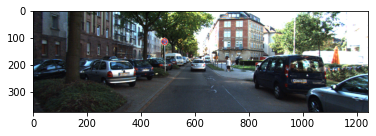

In [6]:
sample = ds_train.take(1)

for example in sample:
    print('------Example------')
    print(list(example.keys()))
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
plt.imshow(img)
plt.show()

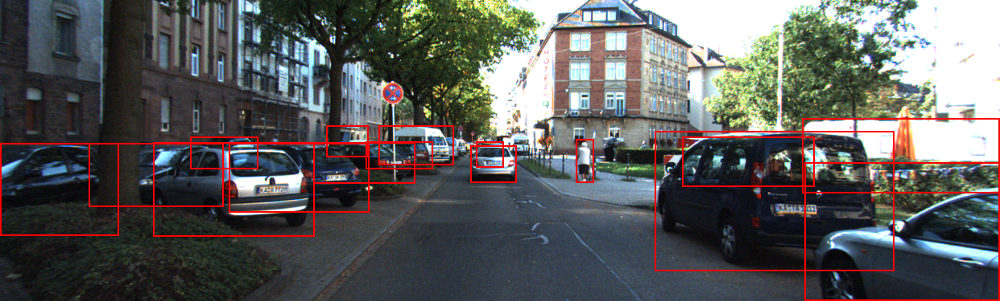

In [7]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height

    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        draw.rectangle(_rect, outline=(255,0,0), width=2)

    return input_image

visualize_bbox(img, objects['bbox'].numpy())

### 데이터 전처리
데이터 파이프라인은 총 4단계
- x와 y좌표 위치 교체
- 무작위로 수평 뒤집기(Flip)
- 이미지 크기 조정 및 패딩 추가
- 좌표계를 [x_min, y_min, x_max, y_max]에서 [x_min, y_min, width, height]으로 수정


In [8]:
def swap_xy(boxes):
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

In [9]:
def random_flip_horizontal(image, boxes):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        # box 좌표 변경
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )

    return image, boxes

**이미지 크기를 바꿀 때는 고려할 점**  
- 이미지의 비율은 그대로 유지
- 이미지의 최대/최소 크기도 제한
- 이미지의 크기를 바꾼 후에도 최종적으로 모델에 입력되는 이미지의 크기는 stride의 배수가 되어야 함
- e.g. 600x720 크기의 이미지
  - 800x960 크기로 수정
  - stride를 128
  - 800x960 크기의 이미지에 패딩을 더해 896x1024 크기의 이미지로 모델에 입력

In [10]:
def resize_and_pad_image(image, training=True):

    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0

    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio

In [11]:
def convert_to_xywh(boxes):
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )

In [12]:
def preprocess_data(sample):
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    # 이미지에 맞게 박스 사이즈 변경
    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

### 인코딩

In [13]:
class AnchorBox:
    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)

In [14]:
def convert_to_corners(boxes):
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

In [15]:
class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()

In [16]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

In [17]:
def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

In [18]:
def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

In [19]:
class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)

In [20]:
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

In [25]:
num_classes = 8
batch_size = 2

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

94781440/94765736 [==============================] - 0s 0us/step


In [22]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)
optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

- [PiecewiseConstantDecay](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/schedules/PiecewiseConstantDecay)
  - 단계적으로 학습률 조절

In [23]:
label_encoder = LabelEncoder()
(train_dataset, val_dataset), dataset_info = tfds.load(
    "kitti", split=["train", "validation"], with_info=True, data_dir=DATA_PATH
)

autotune = tf.data.AUTOTUNE
train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.prefetch(autotune)

val_dataset = val_dataset.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(label_encoder.encode_batch, num_parallel_calls=autotune)
val_dataset = val_dataset.prefetch(autotune)

In [27]:
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    )
]

----

### Train

In [ ]:
import pandas as pd

def save_history_to_csv_path(history, csv_path):
    history_data = history.history
    df = pd.DataFrame(history_data)
    df.to_csv(csv_path, index=False)

- `/aiffel/object_detection/data/checkpoints/` 에 있는 pretrained model을 복사하여 사용

In [ ]:
import os

model_dir = os.getenv('HOME') + '/aiffel/object_detection/checkpoints/'
latest_checkpoint = tf.train.latest_checkpoint(model_dir)

# load the latest saved checkpoint
initial_epoch = 0
if latest_checkpoint:
    print(f"Loading weights from {latest_checkpoint}")
    model.load_weights(latest_checkpoint)
    # set initial epoch from the file name
    initial_epoch = int(latest_checkpoint.split("_epoch_")[-1])
    
additional_epochs = 5

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=initial_epoch + additional_epochs,  # total epochs
    initial_epoch=initial_epoch,  # train from initial epoch
    callbacks=callbacks_list
)

csv_path = os.getenv('HOME') + '/aiffel/object_detection/histories/'
save_history_to_csv_path(history, csv_path + 'from_pretrained_epoch_5.csv')

Loading weights from /aiffel/aiffel/object_detection/checkpoints/weights_epoch_1
Epoch 2/6
3173/3173 [==============================] - 1669s 514ms/step - loss: 0.7116 - val_loss: 1.1514

Epoch 00002: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_2
Epoch 3/6
3173/3173 [==============================] - 1631s 514ms/step - loss: 0.5706 - val_loss: 1.1326

Epoch 00003: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_3
Epoch 4/6
3173/3173 [==============================] - 1630s 513ms/step - loss: 0.4821 - val_loss: 0.9939

Epoch 00004: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_4
Epoch 5/6
3173/3173 [==============================] - 1629s 513ms/step - loss: 0.4018 - val_loss: 0.9814

Epoch 00005: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_5
Epoch 6/6
3173/3173 [==============================] - 1628s 513ms/step - loss: 0.3419 - val_loss: 0.9848

Epoch 00006: saving model to

In [ ]:
model_dir = os.getenv('HOME') + '/aiffel/object_detection/checkpoints/'
latest_checkpoint = tf.train.latest_checkpoint(model_dir)

# load the latest saved checkpoint
initial_epoch = 0
if latest_checkpoint:
    print(f"Loading weights from {latest_checkpoint}")
    model.load_weights(latest_checkpoint)
    # set initial epoch from the file name
    initial_epoch = int(latest_checkpoint.split("_epoch_")[-1])
    
additional_epochs = 15

history2 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=initial_epoch + additional_epochs,
    initial_epoch=initial_epoch, 
    callbacks=callbacks_list
)

csv_path = os.getenv('HOME') + '/aiffel/object_detection/histories/'
save_history_to_csv_path(history2, csv_path + 'from_epoch_5_10.csv')

Loading weights from /aiffel/aiffel/object_detection/checkpoints/weights_epoch_6
Epoch 7/21
3173/3173 [==============================] - 1627s 512ms/step - loss: 0.3019 - val_loss: 0.9634

Epoch 00007: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_7
Epoch 8/21
3173/3173 [==============================] - 1629s 513ms/step - loss: 0.2613 - val_loss: 0.9861

Epoch 00008: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_8
Epoch 9/21
3173/3173 [==============================] - 1630s 513ms/step - loss: 0.2302 - val_loss: 0.9863

Epoch 00009: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_9
Epoch 10/21
3173/3173 [==============================] - 1629s 513ms/step - loss: 0.2080 - val_loss: 1.0339

Epoch 00010: saving model to /aiffel/aiffel/object_detection/checkpoints/weights_epoch_10
Epoch 11/21
1309/3173 [===========>..................] - ETA: 15:32 - loss: 0.2014

- Epoch 7부터 validation loss가 올라감
  - 해당 포인트 사용
  
----

### Visualise Test dataset

,image,image/file_name,objects/alpha,objects/bbox,objects/dimensions,objects/location,objects/occluded,objects/rotation_y,objects/truncated,objects/type
0,,004316.png,1.6,,"ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)",0,1.53,0.0,0 (Car)
1,,003116.png,-1.57-0.98-1.16-1.23-1.36-1.45-1.45...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",0011011...,-1.6-1.57-1.6-1.58-1.59-1.59-1.58...,0.00.570.00.00.00.00.0...,0 (Car)0 (Car)0 (Car)0 (Car)1 (Van)0 (Car)0 (Car)...
2,,002016.png,-1.762.13-2.06,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",100,-1.71.58-1.57,0.00.00.0,6 (Tram)0 (Car)5 (Cyclist)
3,,006893.png,-1.51,,"ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)",0,-1.36,0.0,0 (Car)
4,,002498.png,1.57,,"ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)",0,1.57,0.0,0 (Car)
5,,000805.png,-1.56-1.03-1.23-1.22-1.37-1.42-1.46...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",0102111...,-1.55-1.57-1.57-1.58-1.57-1.57-1.57...,0.00.00.00.00.00.00.0...,0 (Car)0 (Car)0 (Car)0 (Car)0 (Car)0 (Car)0 (Car)...
6,,005498.png,-1.56-1.05-1.25-1.38-1.43-1.47-1.54...,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)...",0000111...,-1.55-1.57-1.57-1.56-1.57-1.57-1.61...,0.00.00.00.00.00.00.0...,0 (Car)0 (Car)0 (Car)0 (Car)0 (Car)7 (Misc)7 (Misc)...
7,,004023.png,2.35-1.76-1.731.93-1.56,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",01201,1.94-1.24-1.232.05-1.12,0.00.00.00.00.0,1 (Van)0 (Car)0 (Car)0 (Car)0 (Car)
8,,003082.png,1.78,,"ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)",0,1.59,0.0,3 (Pedestrian)
9,,000170.png,-1.51-1.49-1.49,,"ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)","ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)ndarray(shape=(3,), dtype=float32)",000,-1.29-1.24-1.19,0.00.00.0,0 (Car)0 (Car)0 (Car)

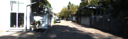
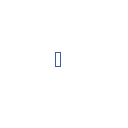
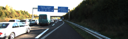
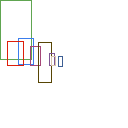
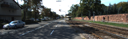
...
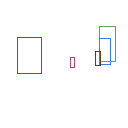
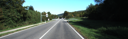
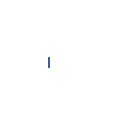
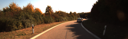
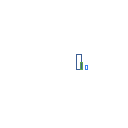

In [21]:
test_dataset = tfds.load("kitti", split="test", data_dir=DATA_PATH)
int2str = ds_info.features["objects"]["type"].int2str

tfds.as_dataframe(test_dataset.take(10), ds_info)

In [22]:
test_dataset

<PrefetchDataset shapes: {image: (None, None, 3), image/file_name: (), objects: {alpha: (None,), bbox: (None, 4), dimensions: (None, 3), location: (None, 3), occluded: (None,), rotation_y: (None,), truncated: (None,), type: (None,)}}, types: {image: tf.uint8, image/file_name: tf.string, objects: {alpha: tf.float32, bbox: tf.float32, dimensions: tf.float32, location: tf.float32, occluded: tf.int64, rotation_y: tf.float32, truncated: tf.float32, type: tf.int64}}>

- [`tf.image.combined_non_max_suppression()`](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)
  - Returns:
    - 'nmsed_boxes' : A [batch_size, max_detections, 4] float32 tensor containing the non-max suppressed boxes.
    - 'nmsed_scores' : A [batch_size, max_detections] float32 tensor containing the scores for the boxes.
    - 'nmsed_classes' : A [batch_size, max_detections] float32 tensor containing the class for boxes.
    - 'valid_detections' : A [batch_size] int32 tensor indicating the number of valid detections per batch item. Only the top valid_detections[i] entries in nms_boxes[i], nms_scores[i] and nms_class[i] are valid. The rest of the entries are zero paddings.

In [23]:
!ls checkpoints/

checkpoint			      weights_epoch_5.data-00000-of-00001
weights_epoch_10.data-00000-of-00001  weights_epoch_5.index
weights_epoch_10.index		      weights_epoch_6.data-00000-of-00001
weights_epoch_1.data-00000-of-00001   weights_epoch_6.index
weights_epoch_1.index		      weights_epoch_7.data-00000-of-00001
weights_epoch_2.data-00000-of-00001   weights_epoch_7.index
weights_epoch_2.index		      weights_epoch_8.data-00000-of-00001
weights_epoch_3.data-00000-of-00001   weights_epoch_8.index
weights_epoch_3.index		      weights_epoch_9.data-00000-of-00001
weights_epoch_4.data-00000-of-00001   weights_epoch_9.index
weights_epoch_4.index


In [24]:
num_classes = 8

model_dir = os.getenv('HOME') + '/aiffel/object_detection/checkpoints/'
resnet50_backbone = get_backbone()

In [25]:
# weight from epoch 1 - pretrained model in data/checkpoints
epoch_1_checkpoint = model_dir + 'weights_epoch_1'
print(f"Loading weights from {epoch_1_checkpoint}")

epoch_1_model = RetinaNet(num_classes, resnet50_backbone)
epoch_1_model.load_weights(epoch_1_checkpoint)

Loading weights from /aiffel/aiffel/object_detection/checkpoints/weights_epoch_1


In [26]:
# weight from epoch 7 - loss: 0.3019 - val_loss: 0.9634
epoch_7_checkpoint = model_dir + 'weights_epoch_7'
print(f"Loading weights from {epoch_7_checkpoint}")

epoch_7_model = RetinaNet(num_classes, resnet50_backbone)
epoch_7_model.load_weights(epoch_7_checkpoint)

Loading weights from /aiffel/aiffel/object_detection/checkpoints/weights_epoch_7


In [27]:
def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, training=False)
    image = tf.keras.applications.resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0), ratio

In [28]:
class DecodePredictions(tf.keras.layers.Layer):

    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            box_variance, dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )

In [38]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = epoch_1_model(image, training=False)

detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

In [ ]:
for sample in test_dataset.take(2):
    image = tf.cast(sample["image"], dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
        int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
    ]
    
    print(num_detections) # the number of detected objects
    print(detections.nmsed_boxes[0][:num_detections], # detected boxes
        detections.nmsed_boxes[0][:num_detections] / ratio, # after re-scaling
        class_names,
        detections.nmsed_scores[0][:num_detections])

1
[[578.6924  162.88705 629.5935  209.03937]] tf.Tensor([[539.18677 151.76724 586.61304 194.76888]], shape=(1, 4), dtype=float32) ['Car'] [0.71728766]
0
[] tf.Tensor([], shape=(0, 4), dtype=float32) [] []


In [36]:
def visualize_detections(
    image, boxes, classes, scores, figsize=(7, 7), linewidth=1, color=[0, 0, 1]
):
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        origin_x, origin_y = x1, image.shape[0] - y2 # matplitlib에서 Rectangle와 text를 그릴 때는 좌하단이 원점이고 위로 갈 수록 y값이 커집니다
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [origin_x, origin_y], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            origin_x,
            origin_y,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax

In [ ]:
def visualize_detections_with_gt(
    image, boxes, classes, scores, gt_bboxes, figsize=(7, 7), linewidth=1, color=[0, 0, 1]
):
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    
    # Denormalise truth boxes
    height, width = image.shape[0], image.shape[1]
    x_min = gt_bboxes[:, 1] * width
    x_max = gt_bboxes[:, 3] * width
    y_min = height - gt_bboxes[:, 0] * height
    y_max = height - gt_bboxes[:, 2] * height
    
    # Draw each ground truth box in red
    for i in range(len(x_min)):
        gt_x = x_min[i]
        gt_y = y_min[i]
        gt_w, gt_h = x_max[i] - x_min[i], y_max[i] - y_min[i]
        gt_patch = plt.Rectangle(
            [gt_x, gt_y], gt_w, gt_h, fill=False, edgecolor=[1, 0, 0]
        )
        ax.add_patch(gt_patch)

        
    # Draw prediction boxes
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        origin_x, origin_y = x1, image.shape[0] - y2  # matplotlib uses bottom-left as origin
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [origin_x, origin_y], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            origin_x,
            origin_y,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
        
    plt.show()
    return ax

In [113]:
def detect_objects(model, ds_test, debug=False):
    for sample in ds_test:
        image = tf.cast(sample["image"], dtype=tf.float32)

        input_image, ratio = prepare_image(image)
        detections = model.predict(input_image)

        # the number of detected classes
        num_detections = detections.valid_detections[0]
        class_names = [
            int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
        ]
        gt_class_names = [
            int2str(int(x)) for x in sample['objects']['type']
        ]

        print('Prediction classes: ', class_names)
        print('Actual classes: ', gt_class_names)

        if debug==True:
            visualize_detections_with_gt(
                image,
                detections.nmsed_boxes[0][:num_detections] / ratio,
                class_names,
                detections.nmsed_scores[0][:num_detections],
                sample['objects']['bbox']
            )

- epoch 1이었을 때 결과

Prediction classes:  ['Car']
Actual classes:  ['Car']


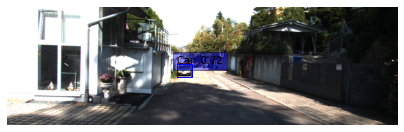

Prediction classes:  []
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car']


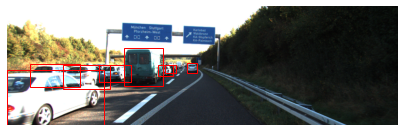

Prediction classes:  ['Car']
Actual classes:  ['Tram', 'Car', 'Cyclist']


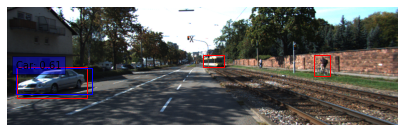

Prediction classes:  []
Actual classes:  ['Car']


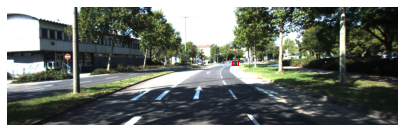

Prediction classes:  []
Actual classes:  ['Car']


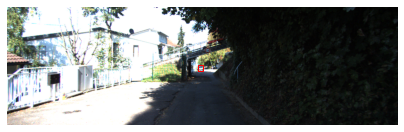

Prediction classes:  ['Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Car']


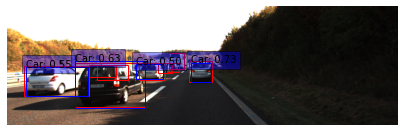

Prediction classes:  ['Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Car', 'Van', 'Car']


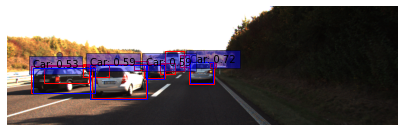

Prediction classes:  ['Car']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


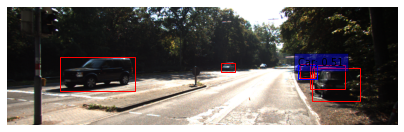

Prediction classes:  []
Actual classes:  ['Pedestrian']


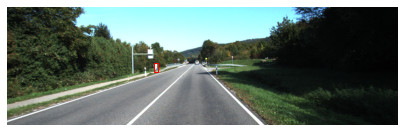

Prediction classes:  []
Actual classes:  ['Car', 'Car', 'Car']


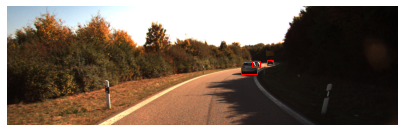

Prediction classes:  []
Actual classes:  ['Car']


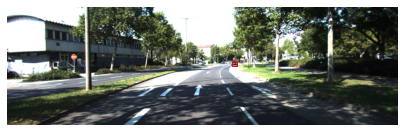

Prediction classes:  []
Actual classes:  ['Car', 'Car']


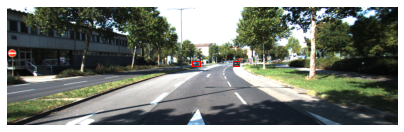

Prediction classes:  ['Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Car', 'Van', 'Car']


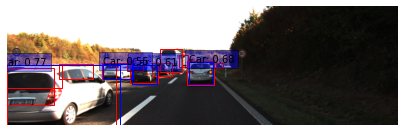

Prediction classes:  []
Actual classes:  ['Pedestrian', 'Pedestrian', 'Van']


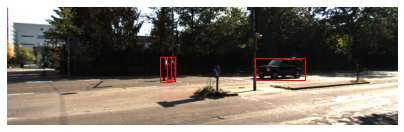

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Van', 'Car']


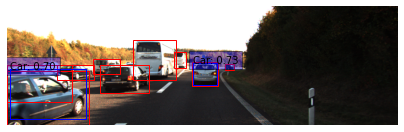

Prediction classes:  []
Actual classes:  ['Car']


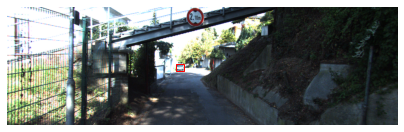

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Misc', 'Car', 'Car', 'Car']


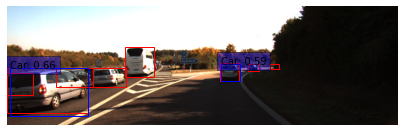

Prediction classes:  []
Actual classes:  ['Car']


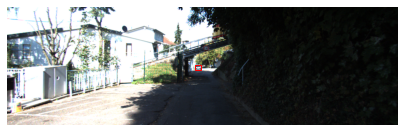

Prediction classes:  []
Actual classes:  ['Car']


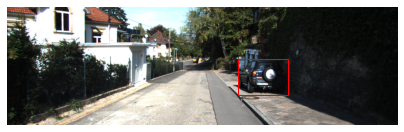

Prediction classes:  []
Actual classes:  ['Pedestrian']


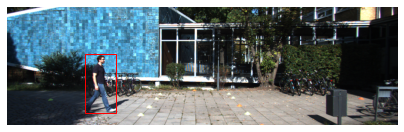

Prediction classes:  []
Actual classes:  ['Pedestrian']


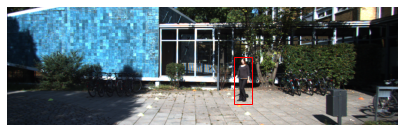

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Car', 'Car']


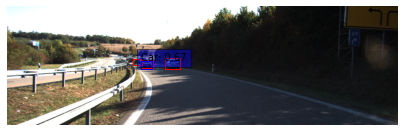

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Van', 'Misc', 'Truck']


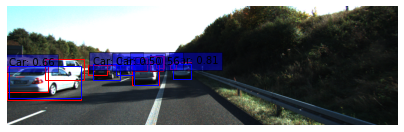

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Van', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc']


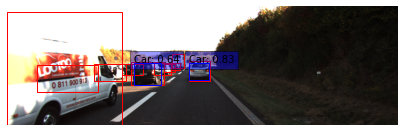

Prediction classes:  []
Actual classes:  ['Pedestrian']


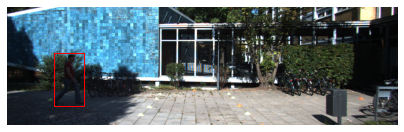

Prediction classes:  []
Actual classes:  ['Car', 'Car', 'Car', 'Misc', 'Car', 'Car']


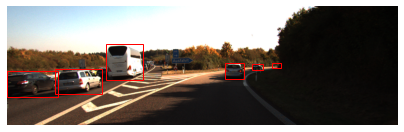

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Van', 'Misc', 'Van', 'Car', 'Car', 'Car', 'Van']


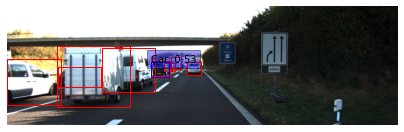

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


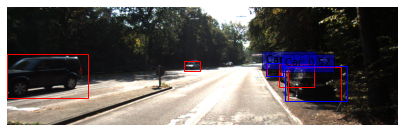

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Misc', 'Van', 'Car', 'Car', 'Car', 'Van']


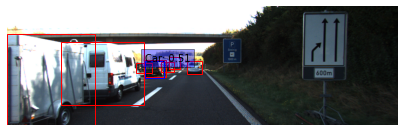

Prediction classes:  []
Actual classes:  ['Car', 'Car']


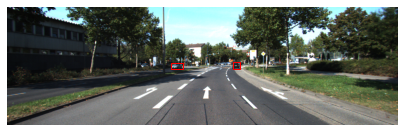

Prediction classes:  ['Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car']


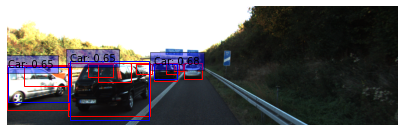

Prediction classes:  []
Actual classes:  ['Car', 'Misc', 'Car']


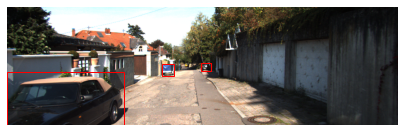

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Car', 'Car', 'Van', 'Car', 'Misc', 'Car']


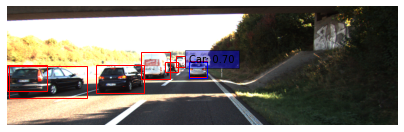

Prediction classes:  ['Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Misc', 'Misc', 'Truck', 'Car']


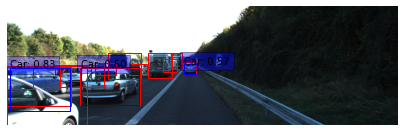

Prediction classes:  []
Actual classes:  ['Car', 'Car', 'Car']


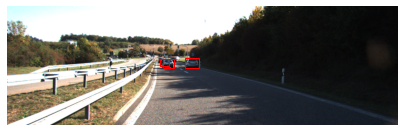

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


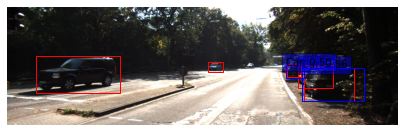

Prediction classes:  ['Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Misc', 'Van', 'Car', 'Car', 'Van', 'Car']


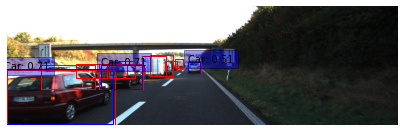

Prediction classes:  ['Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Van', 'Car', 'Van', 'Car']


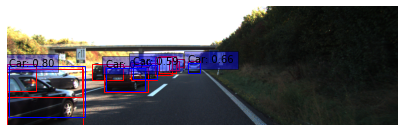

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car']


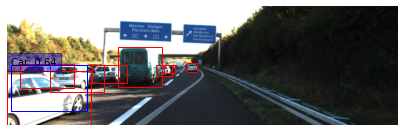

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car', 'Pedestrian', 'Cyclist', 'Car', 'Van', 'Car', 'Car', 'Car']


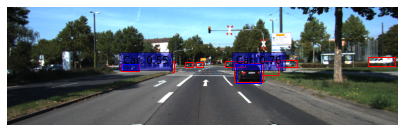

In [114]:
detect_objects(inference_model, test_dataset.take(40), debug=True)

- epoch 7 모델의 결과

Prediction classes:  ['Car']
Actual classes:  ['Car']


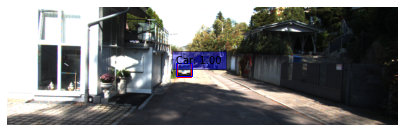

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Truck', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car']


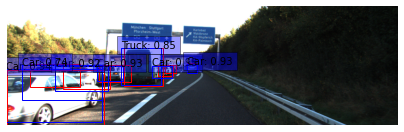

Prediction classes:  ['Car', 'Tram']
Actual classes:  ['Tram', 'Car', 'Cyclist']


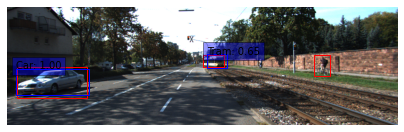

Prediction classes:  []
Actual classes:  ['Car']


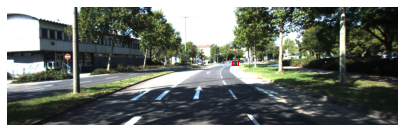

Prediction classes:  []
Actual classes:  ['Car']


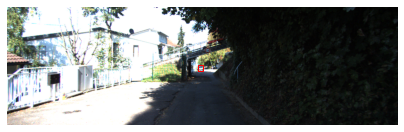

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Truck']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Car']


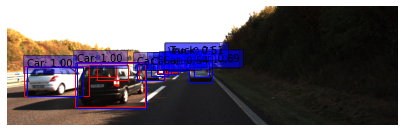

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Truck', 'Car', 'Van', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Car', 'Van', 'Car']


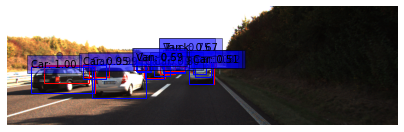

Prediction classes:  ['Car', 'Car', 'Car', 'Van', 'Car', 'Car']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


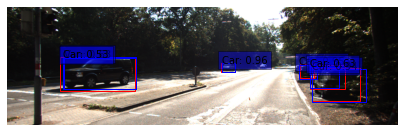

Prediction classes:  []
Actual classes:  ['Pedestrian']


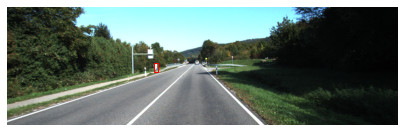

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Car', 'Car']


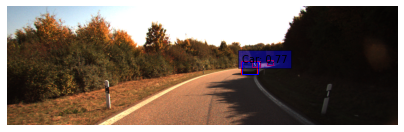

Prediction classes:  []
Actual classes:  ['Car']


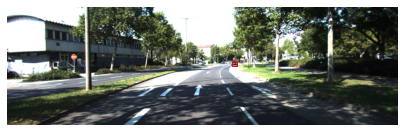

Prediction classes:  ['Car']
Actual classes:  ['Car', 'Car']


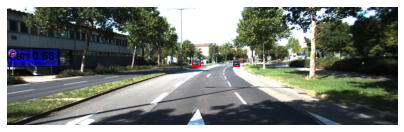

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Truck', 'Van', 'Car', 'Van']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Car', 'Van', 'Car']


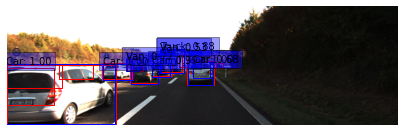

Prediction classes:  ['Car', 'Pedestrian']
Actual classes:  ['Pedestrian', 'Pedestrian', 'Van']


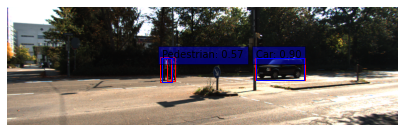

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Van', 'Car', 'Truck']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Misc', 'Misc', 'Car', 'Van', 'Car']


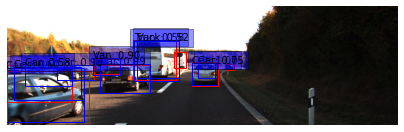

Prediction classes:  ['Car']
Actual classes:  ['Car']


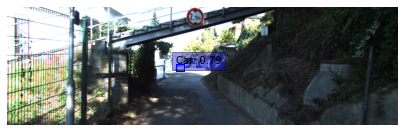

Prediction classes:  ['Car', 'Car', 'Car', 'Van', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Misc', 'Car', 'Car', 'Car']


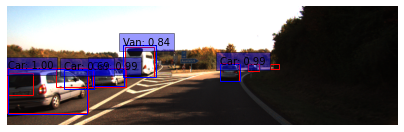

Prediction classes:  []
Actual classes:  ['Car']


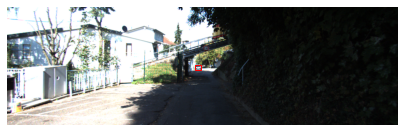

Prediction classes:  ['Car']
Actual classes:  ['Car']


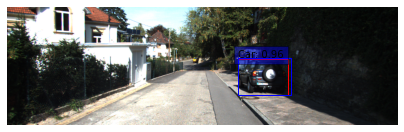

Prediction classes:  ['Pedestrian']
Actual classes:  ['Pedestrian']


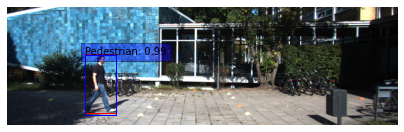

Prediction classes:  ['Pedestrian']
Actual classes:  ['Pedestrian']


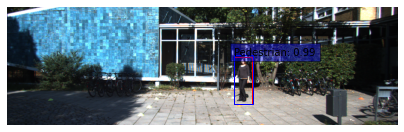

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car']


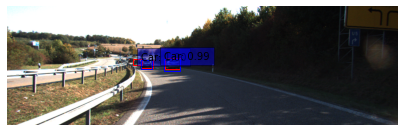

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Van', 'Misc', 'Truck']


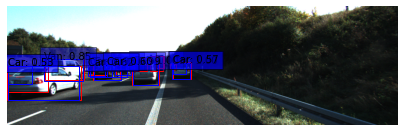

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Truck']
Actual classes:  ['Car', 'Van', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc']


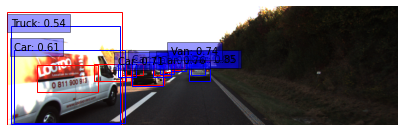

Prediction classes:  ['Pedestrian']
Actual classes:  ['Pedestrian']


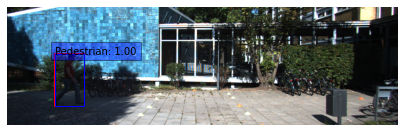

Prediction classes:  ['Car', 'Car', 'Car', 'Van', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Misc', 'Car', 'Car']


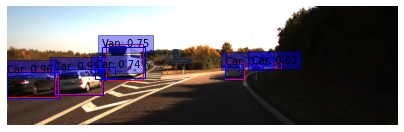

Prediction classes:  ['Car', 'Car', 'Car', 'Van', 'Van', 'Van', 'Car', 'Car', 'Van']
Actual classes:  ['Car', 'Van', 'Misc', 'Van', 'Car', 'Car', 'Car', 'Van']


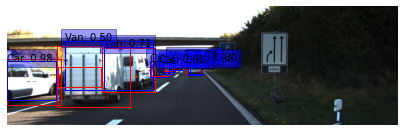

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


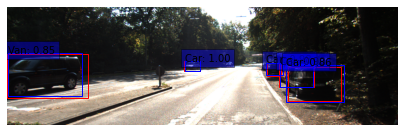

Prediction classes:  ['Car', 'Car', 'Van', 'Van', 'Van', 'Car']
Actual classes:  ['Car', 'Misc', 'Van', 'Car', 'Car', 'Car', 'Van']


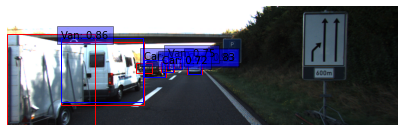

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car']


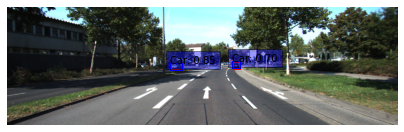

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Van']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car']


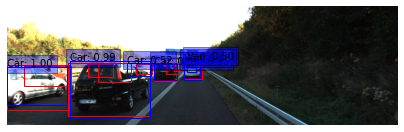

Prediction classes:  ['Car', 'Misc']
Actual classes:  ['Car', 'Misc', 'Car']


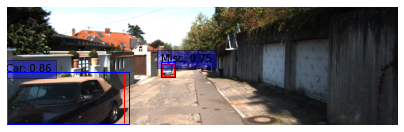

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Van', 'Car', 'Van']
Actual classes:  ['Car', 'Car', 'Car', 'Van', 'Car', 'Misc', 'Car']


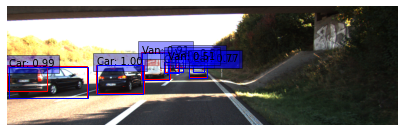

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Truck', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Misc', 'Misc', 'Truck', 'Car']


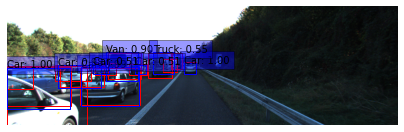

Prediction classes:  ['Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car']


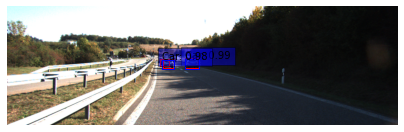

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Van']
Actual classes:  ['Van', 'Car', 'Car', 'Car', 'Car']


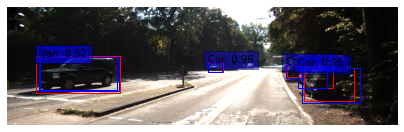

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Van']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Misc', 'Van', 'Car', 'Car', 'Van', 'Car']


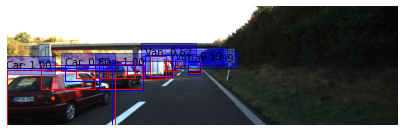

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Van']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Misc', 'Van', 'Car', 'Van', 'Car']


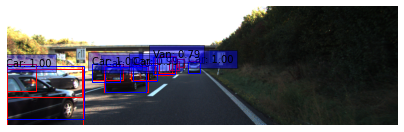

Prediction classes:  ['Car', 'Car', 'Car', 'Car', 'Truck', 'Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Car', 'Car', 'Van', 'Car', 'Car', 'Car']


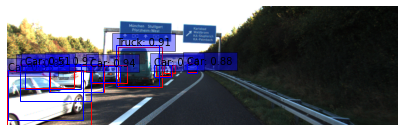

Prediction classes:  ['Car', 'Car', 'Car']
Actual classes:  ['Car', 'Car', 'Pedestrian', 'Cyclist', 'Car', 'Van', 'Car', 'Car', 'Car']


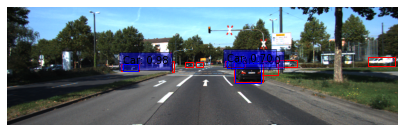

In [115]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = epoch_7_model(image, training=False)

detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
epoch_7_inference_model = tf.keras.Model(inputs=image, outputs=detections)

detect_objects(epoch_7_inference_model, test_dataset.take(40), debug=True)

----

### `Stop`, `Go` 출력하기
- label : 0 - `Car`, 1 - `Van`, 2 - `Truck`, 3 - `Pedestrian`, 4 - `Person_sitting`, 5 - `Cyclist`, 6 - `Tram`, 7 - `Misc` or `DontCare`
- `Stop` 출력 조건
  - 사람이 한 명 이상 있는 경우
  - 차량의 크기(width or height)가 300px이상인 경우

['Pedestrian']


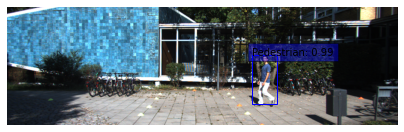

Human exist, stop

Stop


In [ ]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/data/stop_1.png'

def self_drive_assist(model, img_path, size_limit=300, debug=True):
    # 1) Load image
    image = Image.open(img_path)
    input_image, ratio = prepare_image(image)
    
    # 2) Predict
    detections = model.predict(input_image)
    
    num_detections = detections.valid_detections[0]
    class_names = [
        int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
    ]
    boxes = detections.nmsed_boxes[0][:num_detections] / ratio
    
    if debug == True:
        print(class_names)
        visualize_detections(
            image,
            boxes,
            class_names,
            detections.nmsed_scores[0][:num_detections],
        )
        
    # 3) Check
    answer = 'Go'
    
    human_list = ['Pedestrian', 'Person_sitting']
    if any(item in human_list for item in class_names):
        print('Human exist, stop\n')
        return 'Stop'
    
    vehicle_list = ['Car', 'Van', 'Truck', 'Cyclist']
    if not any(item in vehicle_list for item in class_names):
        return 'Go'
        
    for i in range(len(class_names)):
        if not class_names[i] in vehicle_list:
            continue

        x1, y1, x2, y2 = boxes[i]
        w, h = x2 - x1, y2 - y1

        if w >= 300 or h >= 300:
            print('Vehicle is too close, stop\n')
            return 'Stop'
    
    return answer

print(self_drive_assist(epoch_7_inference_model, img_path))

['Pedestrian']


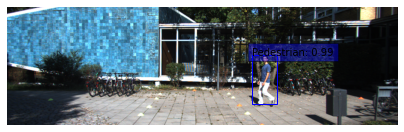

Human exist, stop

['Pedestrian']


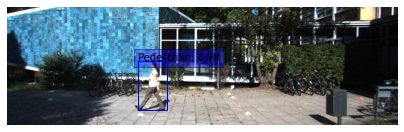

Human exist, stop

['Car', 'Car', 'Cyclist']


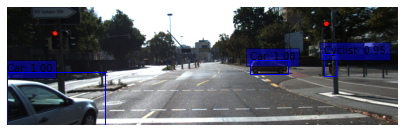

Vehicle is too close, stop

['Car', 'Car', 'Car', 'Van', 'Van', 'Car', 'Van', 'Car', 'Van', 'Truck', 'Car']


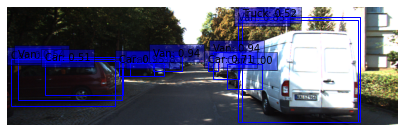

Vehicle is too close, stop

['Car', 'Car', 'Car', 'Van', 'Car', 'Misc', 'Car']


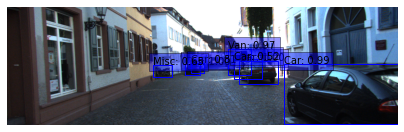

Vehicle is too close, stop

['Car', 'Truck', 'Truck', 'Car', 'Misc']


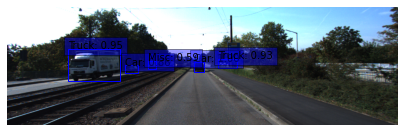

['Car', 'Car', 'Car']


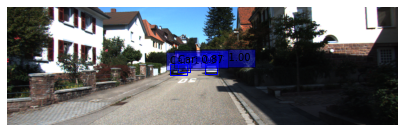

['Car', 'Car', 'Cyclist']


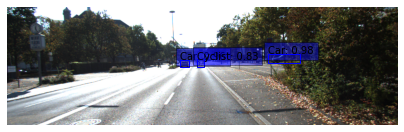

['Car']


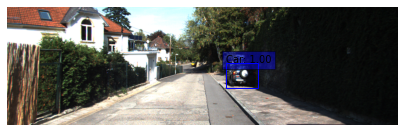

['Car', 'Car', 'Car', 'Car', 'Car', 'Car']


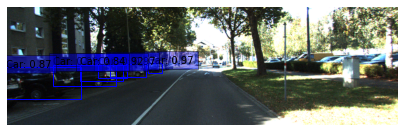

100점입니다.


In [135]:
import os

def test_system(func, model):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection/data'
    score = 0
    test_set=[
        ("stop_1.png", "Stop"),
        ("stop_2.png", "Stop"),
        ("stop_3.png", "Stop"),
        ("stop_4.png", "Stop"),
        ("stop_5.png", "Stop"),
        ("go_1.png", "Go"),
        ("go_2.png", "Go"),
        ("go_3.png", "Go"),
        ("go_4.png", "Go"),
        ("go_5.png", "Go"),
    ]
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(model, image_path)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist, epoch_7_inference_model)

### 회고
- 테스트 데이터에 대해서 mAP를 계산해서 성능 평가를 하고 싶었는데, 이해 부족으로 구현 못함
- 메모리 문제로 배치를 적게 해서 돌려서 아쉽
- focal loss를 써서 작은 물체에 대해서도 어느 정도 성능이 나오는 것 같음
- `Stop`, `Go`를 간단하게 판별하는 함수를 구현할 때 `Cyclist`를 사람으로 봐야하는지 잠깐 고민했는데, 보통 도로에서 타니깐 vehicle로 취급함
- 데이터 셋에 각 물체에 대하여 truncated, occluded 등의 정보가 있던데 그런 정보를 같이 학습하여 예측할 수 있으면, 판단에 좋은 영향을 줄 것 같음